In [23]:
import os
from os.path import isdir, join
from pathlib import Path
import pandas as pd

# Math
import numpy as np
from scipy.fftpack import fft
from scipy import signal
from scipy.io import wavfile
import librosa

from sklearn.decomposition import PCA

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
import librosa.display

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import pandas as pd

%matplotlib inline


# 1. Visualization 
<a id="visualization"></a> 

There are two theories of a human hearing - place ( https://en.wikipedia.org/wiki/Place_theory_(hearing) (frequency-based) and temporal (https://en.wikipedia.org/wiki/Temporal_theory_(hearing) )
In speech recognition, I see two main tendencies - to input [spectrogram](https://en.wikipedia.org/wiki/Spectrogram) (frequencies), and more sophisticated features MFCC - Mel-Frequency Cepstral Coefficients, PLP. You rarely work with raw, temporal data.

Let's visualize some recordings!

## 1.1. Wave and spectrogram:
<a id="waveandspectrogram"></a> 

Choose and read some file:  

In [24]:
train_audio_path = 'data/train/audio'
filename = '/yes/0a7c2a8d_nohash_0.wav'
sample_rate, samples = wavfile.read(str(train_audio_path) + filename)

Define a function that calculates spectrogram.  

Note, that we are taking logarithm of spectrogram values. It will make our plot much more clear, moreover, it is strictly connected to the way people hear.
We need to assure that there are no 0 values as input to logarithm.  

In [18]:
def log_specgram(audio, sample_rate, window_size=20,
                 step_size=10, eps=1e-10):
    nperseg = int(round(window_size * sample_rate / 1e3))
    noverlap = int(round(step_size * sample_rate / 1e3))
    freqs, times, spec = signal.spectrogram(audio,
                                    fs=sample_rate,
                                    window='hann',
                                    nperseg=nperseg,
                                    noverlap=noverlap,
                                    detrend=False)
    return freqs, times, np.log(spec.T.astype(np.float32) + eps)

Frequencies are in range (0, 8000) according to [Nyquist theorem](https://en.wikipedia.org/wiki/Nyquist_rate).  
Let's plot it:  


Text(0.5,0,'Seconds')

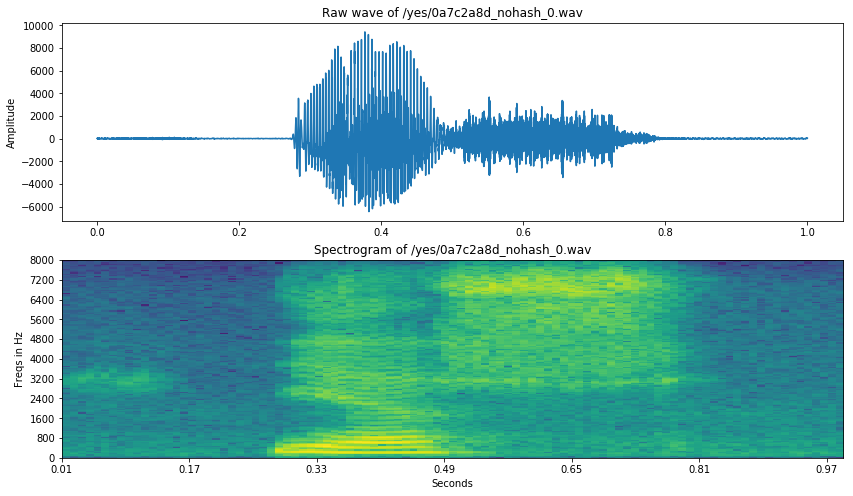

In [19]:
freqs, times, spectrogram = log_specgram(samples, sample_rate)
time = np.arange(0, float(samples.shape[0]), 1) / sample_rate
fig = plt.figure(figsize=(14, 8))
ax1 = fig.add_subplot(211)
ax1.set_title('Raw wave of ' + filename)
ax1.set_ylabel('Amplitude')
ax1.plot(time, samples)

ax2 = fig.add_subplot(212)
ax2.imshow(spectrogram.T, aspect='auto', origin='lower', 
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])
ax2.set_title('Spectrogram of ' + filename)
ax2.set_ylabel('Freqs in Hz')
ax2.set_xlabel('Seconds')

## 1.2. Mel-Scaled & MFCC Spectrograms
<a id="mfcc"></a> 

If you want to get to know some details about *MFCC* take a look at this great tutorial. [MFCC explained](http://practicalcryptography.com/miscellaneous/machine-learning/guide-mel-frequency-cepstral-coefficients-mfccs/) You can see, that it is well prepared to imitate human hearing properties.

You can calculate *Mel power spectrogram* and *MFCC* using for example *librosa* python package.


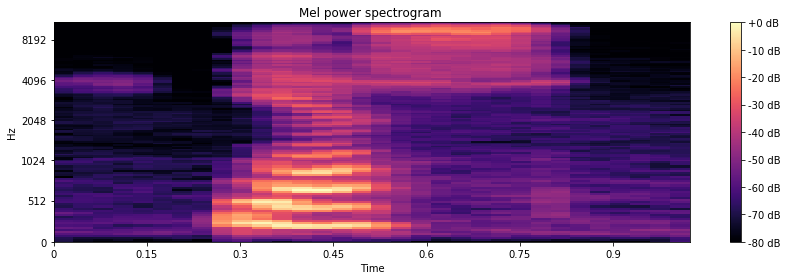

In [19]:

S = librosa.feature.melspectrogram(samples.astype(np.float32), sample_rate, n_mels=128)

# Convert to log scale (dB). We'll use the peak power (max) as reference.
log_S = librosa.power_to_db(S, ref=np.max)

plt.figure(figsize=(12, 4))
librosa.display.specshow(log_S, sr=sample_rate, x_axis='time', y_axis='mel')
plt.title('Mel power spectrogram ')
plt.colorbar(format='%+02.0f dB')
plt.tight_layout()

In [20]:
y=samples.astype(np.float32)
sr=sample_rate
librosa.feature.melspectrogram(y=y, sr=sr)

array([[  1.10254348e+04,   2.79904850e+03,   1.80273608e+02, ...,
          5.05427754e+02,   7.80124041e+03,   6.73888546e+04],
       [  1.43871056e+04,   4.29335928e+03,   2.64212331e+03, ...,
          6.11986427e+03,   7.62362826e+03,   4.97340270e+04],
       [  1.77644209e+04,   7.89857625e+03,   8.57688729e+03, ...,
          4.50055309e+04,   1.95371682e+04,   6.92738289e+04],
       ..., 
       [  4.34525245e+01,   4.36035489e+01,   4.49347779e+01, ...,
          5.57389501e+01,   4.46625135e+01,   7.92042849e+01],
       [  3.41548871e+01,   1.67619118e+01,   1.03688566e+01, ...,
          2.93602414e+01,   1.74280329e+01,   4.19052133e+01],
       [  2.74230976e+01,   1.30651073e+01,   7.54172615e+00, ...,
          1.15657255e+01,   8.87533904e+00,   2.66837428e+01]])

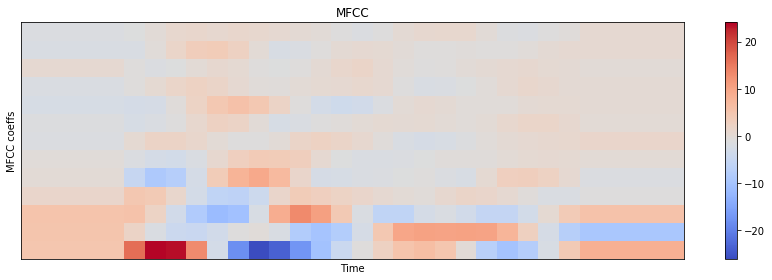

In [21]:
mfcc = librosa.feature.mfcc(S=log_S, n_mfcc=13)

# Let's pad on the first and second deltas while we're at it
delta2_mfcc = librosa.feature.delta(mfcc, order=2)

plt.figure(figsize=(12, 4))
librosa.display.specshow(delta2_mfcc)
plt.ylabel('MFCC coeffs')
plt.xlabel('Time')
plt.title('MFCC')
plt.colorbar()
plt.tight_layout()

In classical, but still state-of-the-art systems, *MFCC*  or similar features are taken as the input to the system instead of spectrograms.

However, in end-to-end (often neural-network based) systems, the most common input features are probably raw spectrograms, or mel power spectrograms. For example *MFCC* decorrelates features, but NNs deal with correlated features well. Also, if you'll understand mel filters, you may consider their usage sensible.a

It is your decision which to choose!

## 1.3. Spectrograms in 3d
<a id="3d"></a> 

By the way, times change, and the tools change. Have you ever seen spectrogram in 3d?

In [392]:
data = [go.Surface( z=log_S.T)]
layout = go.Layout(
    title='Mel-Scaled Specgtrogram of "yes" in 3d',
    scene = dict(
    yaxis = dict(title='CoEff'),
    xaxis = dict(title='Time'), 
    zaxis = dict(title='Log amplitude'),
    ),
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

In [393]:
data = [go.Surface( z=delta2_mfcc.T)]
layout = go.Layout(
    title='MFCC Specgtrogram of "yes" in 3d',
    scene = dict(
    yaxis = dict(title='CoEff'),
    xaxis = dict(title='Time'), 
    zaxis = dict(title='Log amplitude'),
    ),
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

In [394]:
data = [go.Surface(x=times, y=freqs, z=spectrogram.T)]
layout = go.Layout(
    title='Log Specgtrogram of "yes" in 3d',
    scene = dict(
    yaxis = dict(nticks = (freqs[::16]),title='Frequency', range=[freqs.min(),freqs.max()]),
    xaxis = dict(nticks = (times[::16]),title='Time', range=[times.min(),times.max()],),
    zaxis = dict(title='Log amplitude'),
    ),
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

## 1.4. Silence removal
<a id="silenceremoval"></a> 

Let's listen to that file

In [32]:
ipd.Audio(samples, rate=sample_rate)

I consider that some *VAD* (Voice Activity Detection) will be really useful here. Although the words are short, there is a lot of silence in them. A decent *VAD* can reduce training size a lot, accelerating training speed significantly.
Let's cut a bit of the file from the beginning and from the end. and listen to it again (based on a plot above, we take from 4000 to 13000):

In [34]:
samples_cut = samples[4000:13000]
ipd.Audio(samples_cut, rate=sample_rate)

We can agree that the entire word can be heard. It is impossible to cut all the files manually and do this basing on the simple plot. But you can use for example *webrtcvad* package to have a good *VAD*.

Let's plot it again, together with guessed alignment of* 'y' 'e' 's'* graphems

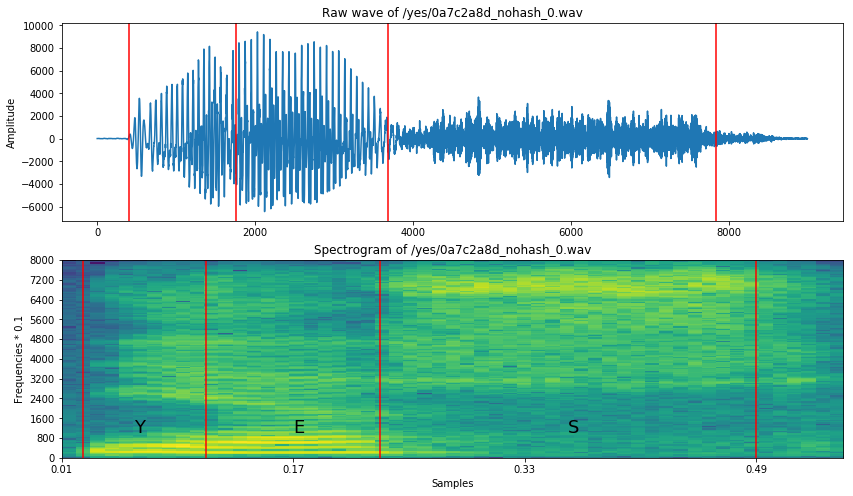

In [35]:
freqs, times, spectrogram_cut = log_specgram(samples_cut, sample_rate)

fig = plt.figure(figsize=(14, 8))
ax1 = fig.add_subplot(211)
ax1.set_title('Raw wave of ' + filename)
ax1.set_ylabel('Amplitude')
ax1.plot(samples_cut)

ax2 = fig.add_subplot(212)
ax2.set_title('Spectrogram of ' + filename)
ax2.set_ylabel('Frequencies * 0.1')
ax2.set_xlabel('Samples')
ax2.imshow(spectrogram_cut.T, aspect='auto', origin='lower', 
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])
ax2.text(0.06, 1000, 'Y', fontsize=18)
ax2.text(0.17, 1000, 'E', fontsize=18)
ax2.text(0.36, 1000, 'S', fontsize=18)

xcoords = [0.025, 0.11, 0.23, 0.49]
for xc in xcoords:
    ax1.axvline(x=xc*16000, c='r')
    ax2.axvline(x=xc, c='r')

## 1.5. Resampling - dimensionality reduction
<a id="resampl"></a> 

Another way to reduce the dimensionality of our data is to resample recordings.

You can hear that the recording don't sound very natural, because they are sampled with 16k frequency, and we usually hear much more. However, [the most speech related frequencies are presented in smaller band](https://en.wikipedia.org/wiki/Voice_frequency). That's why you can still understand another person talking to the telephone, where GSM signal is sampled to 8000 Hz.

Summarizing, we could resample our dataset to 8k. We will discard some information that shouldn't be important, and we'll reduce size of the data.

We have to remember that it can be risky, because this is a competition, and sometimes very small difference in performance wins, so we don't want to lost anything. On the other hand, first experiments can be done much faster with smaller training size.

We'll need to calculate FFT (Fast Fourier Transform). Definition:


In [30]:
def custom_fft(y, fs):
    T = 1.0 / fs
    N = y.shape[0]
    yf = fft(y)
    xf = np.linspace(0.0, 1.0/(2.0*T), N//2)
    vals = 2.0/N * np.abs(yf[0:N//2])  # FFT is simmetrical, so we take just the first half
    # FFT is also complex, to we take just the real part (abs)
    return xf, vals

Looking at the FFT we can see that there is not much information above 4Khz and that the wave file is now half as complex as before (only the top half of the wav files information is retained)

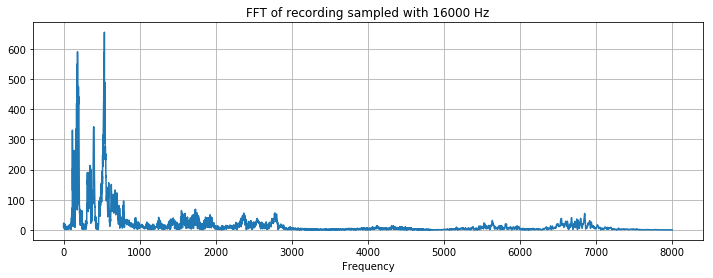

In [31]:
xf, vals = custom_fft(samples, sample_rate)
plt.figure(figsize=(12, 4))
plt.title('FFT of recording sampled with ' + str(sample_rate) + ' Hz')
plt.plot(xf, vals)
plt.xlabel('Frequency')
plt.grid()
plt.show()

## Features extraction steps
<a id="featuresextractionsteps"></a> 

I would propose the feature extraction steps should be:
1. Resampling (FFT)
2. *VAD*
3. Padding with 0 to make signals be equal length
4. Mel-Log spectrogram (or *MFCC*, or raw log-scaled spectrogram)



# Data Exploration
<a id="investigations"></a> 

This is an initial investigation of the Speech_Commands_v0.01 Dataset.
##  Number of records
<a id="numberoffiles"></a> 
Let's count the number of labels present in our directory

In [25]:
dirs = [f for f in os.listdir(train_audio_path) if isdir(join(train_audio_path, f))]
dirs.sort()
print('Number of labels: ' + str(len(dirs)))

Number of labels: 31


And also the number of recordings, arranged per class

In [26]:
# Calculate
number_of_recordings = []
for direct in dirs:
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    number_of_recordings.append(len(waves))

# Plot
data = [go.Histogram(x=dirs, y=number_of_recordings)]
trace = go.Bar(
    x=dirs,
    y=number_of_recordings,
    marker=dict(color = number_of_recordings, colorscale='Viridius', showscale=True
    ),
)
layout = go.Layout(
    title='Number of recordings in given label',
    xaxis = dict(title='Words'),
    yaxis = dict(title='Number of recordings')
)
py.iplot(go.Figure(data=[trace], layout=layout))


With the exception of the "Silence" files, the dataset appears to be quite balanced per word. However when we group together the "unknown" words (e.g. non-command words) then the dataset is heavily weighted in that one category.

## Deeper into the recordings
<a id="deeper"></a> 

Since these files are crowdsourced and recorded under non-regulated conditions, there is a wide range and variety of distortions, compression and qualities as well as a variety of different voices and volumes.

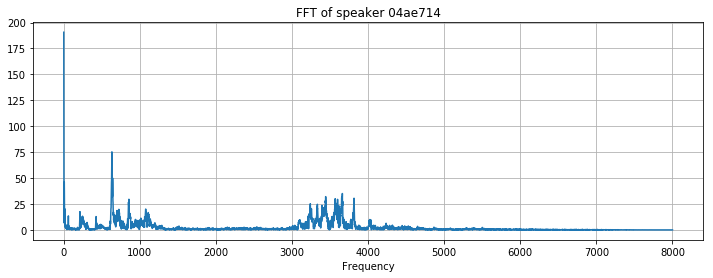

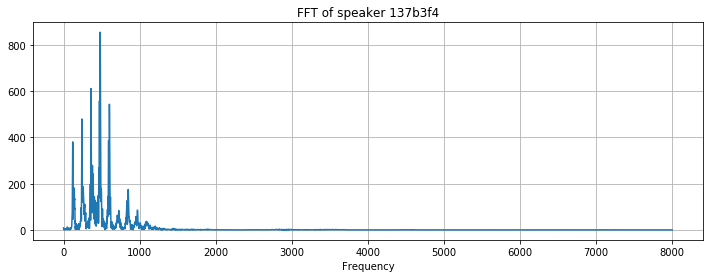

In [30]:
filenames = ['on/004ae714_nohash_0.wav', 'on/0137b3f4_nohash_0.wav']
for filename in filenames:
    sample_rate, samples = wavfile.read(str(train_audio_path) + filename)
    xf, vals = custom_fft(samples, sample_rate)
    plt.figure(figsize=(12, 4))
    plt.title('FFT of speaker ' + filename[4:11])
    plt.plot(xf, vals)
    plt.xlabel('Frequency')
    plt.grid()
    plt.show()

This is even more evident when we hear the samples:

In [31]:
print('Speaker ' + filenames[0][4:11])
ipd.Audio(join(train_audio_path, filenames[0]))

Speaker 04ae714


In [32]:
print('Speaker ' + filenames[1][4:11])
ipd.Audio(join(train_audio_path, filenames[1]))

Speaker 137b3f4


We can see that there are several files which have severe distortion/compression issues such as those below. Thankfully our dataset is large enough to minimize the effect of these on the overall performance of the model


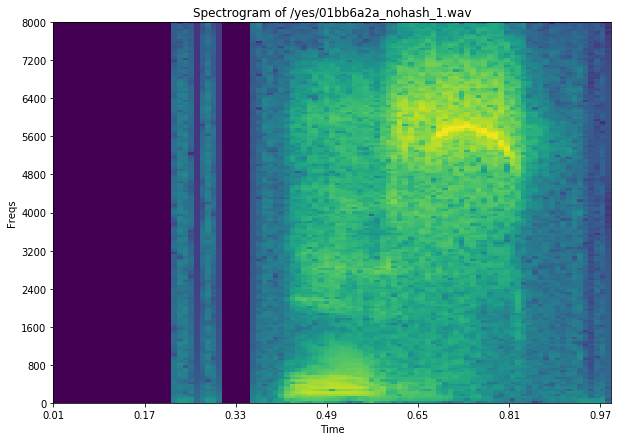

In [84]:
filename = '/yes/01bb6a2a_nohash_1.wav'
sample_rate, samples = wavfile.read(str(train_audio_path) + filename)
freqs, times, spectrogram = log_specgram(samples, sample_rate)

plt.figure(figsize=(10, 7))
plt.title('Spectrogram of ' + filename)
plt.ylabel('Freqs')
plt.xlabel('Time')
plt.imshow(spectrogram.T, aspect='auto', origin='lower', 
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
plt.yticks(freqs[::16])
plt.xticks(times[::16])
plt.show()

data = [go.Surface(z=spectrogram.T)]
layout = go.Layout(
    title='Specgtrogram of ' + filename + ' in 3d',
    scene = dict(
    yaxis = dict(title='Frequencies', range=freqs),
    xaxis = dict(title='Time', range=times),
    zaxis = dict(title='Log amplitude'),
    ),
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

It means, that we have to prevent overfitting to the very specific acoustical environments.


## Recordings length
<a id="len"></a> 

In order to process the data without errors it is important that all of the samples are exactly 1 second as they should be in the dataset. Below is a function to check this.

In [28]:
num_of_shorter = 0
for direct in dirs:
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    for wav in waves:
        sample_rate, samples = wavfile.read(train_audio_path+ '/'+ direct + '/' + wav)
        if samples.shape[0] < sample_rate:
            num_of_shorter += 1
print('Number of recordings shorter than 1 second: ' + str(num_of_shorter))

Number of recordings shorter than 1 second: 6476


There are a large number of shorter files which we will need to pad with 0s at a later stage to make them valid for use with any model

## Frequency components across the words
<a id="components"></a> 
Each word could be identified using the different frequency components that would be present due to the different vowels and phonemes it consists of. Voilin plots like those below can be used to plot data to see the intensity of frequencies across the words at a given band e.g. 1000, 2500 and 7500 Hz

In [130]:
def violinplot_frequency(dirs, freq_ind):
    """ Plot violinplots for given words (waves in dirs) and frequency freq_ind
    from all frequencies freqs."""

    spec_all = []  # Contain spectrograms
    ind = 0
    for direct in dirs:
        spec_all.append([])

        waves = [f for f in os.listdir(join(train_audio_path, direct)) if
                 f.endswith('.wav')]
        for wav in waves[:100]:
            sample_rate, samples = wavfile.read(
                train_audio_path + direct + '/' + wav)
            freqs, times, spec = log_specgram(samples, sample_rate)
            spec_all[ind].extend(spec[:, freq_ind])
        ind += 1

    # Different lengths = different num of frames. Make number equal
    minimum = min([len(spec) for spec in spec_all])
    spec_all = np.array([spec[:minimum] for spec in spec_all])

    plt.figure(figsize=(13,7))
    plt.title('Frequency ' + str(freqs[freq_ind]) + ' Hz')
    plt.ylabel('Amount of frequency in a word')
    plt.xlabel('Words')
    sns.violinplot(data=pd.DataFrame(spec_all.T, columns=dirs))
    plt.show()

/usr/local/src/conda3_runtime/home/envs/DSX-Python35-Spark/lib/python3.5/site-packages/seaborn/categorical.py:598: FutureWarning:

remove_na is deprecated and is a private function. Do not use.

/usr/local/src/conda3_runtime/home/envs/DSX-Python35-Spark/lib/python3.5/site-packages/seaborn/categorical.py:826: FutureWarning:

remove_na is deprecated and is a private function. Do not use.



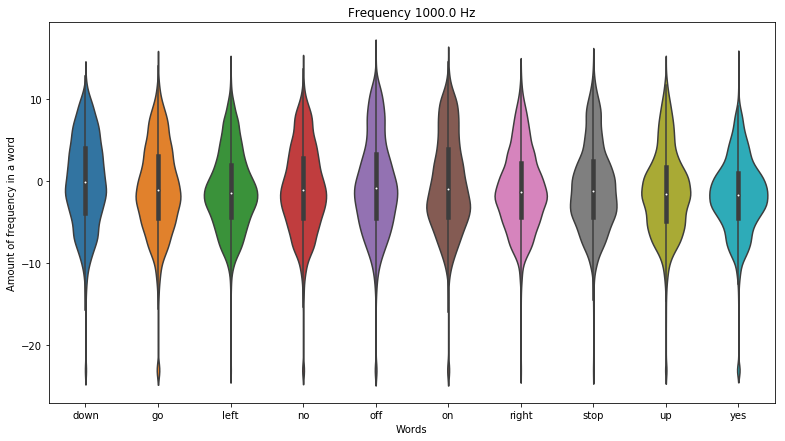

In [41]:
violinplot_frequency(dirs, 20)

/usr/local/src/conda3_runtime/home/envs/DSX-Python35-Spark/lib/python3.5/site-packages/seaborn/categorical.py:598: FutureWarning:

remove_na is deprecated and is a private function. Do not use.

/usr/local/src/conda3_runtime/home/envs/DSX-Python35-Spark/lib/python3.5/site-packages/seaborn/categorical.py:826: FutureWarning:

remove_na is deprecated and is a private function. Do not use.



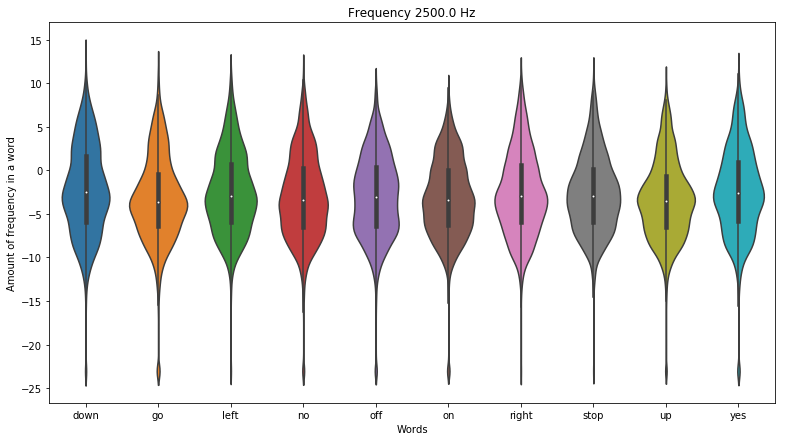

In [43]:
violinplot_frequency(dirs, 50)

/usr/local/src/conda3_runtime/home/envs/DSX-Python35-Spark/lib/python3.5/site-packages/seaborn/categorical.py:598: FutureWarning:

remove_na is deprecated and is a private function. Do not use.

/usr/local/src/conda3_runtime/home/envs/DSX-Python35-Spark/lib/python3.5/site-packages/seaborn/categorical.py:826: FutureWarning:

remove_na is deprecated and is a private function. Do not use.



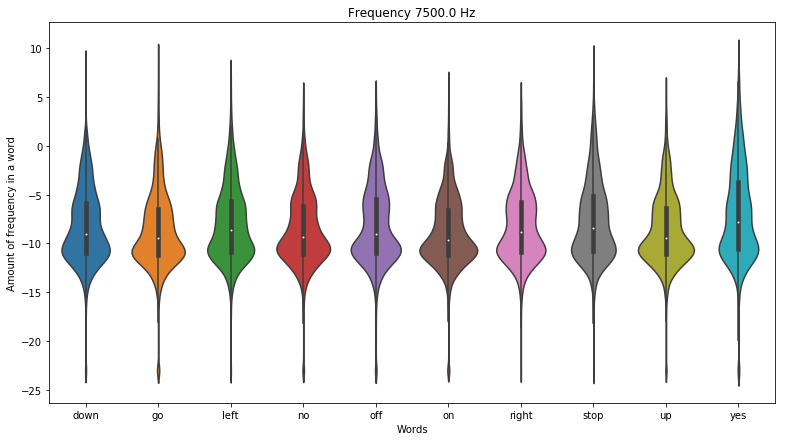

In [131]:
violinplot_frequency(dirs, 150)

## Anomaly detection
<a id="anomaly"></a> 

In a dataset this large, especially one which has been crowd-sourced, there may be several anomalous samples which might be corrupted/distorted or not match the label they have been assigned. Below is a graph of the dataset that uses a PCA function to reduce dimensionality and plot the data, complete with labels, allowing us to find the outliers.

In [407]:
train_audio_path ='data/train/audio/'
[d for d in os.listdir(train_audio_path) if d in to_keep]
fft_all = []
names = []
for direct in dirs:
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    for wav in waves:
        sample_rate, samples = wavfile.read(train_audio_path + '/'+ direct + '/' + wav)
        if samples.shape[0] != sample_rate:
            samples = np.append(samples, np.zeros((sample_rate - samples.shape[0], )))
        x, val = custom_fft(samples, sample_rate)
        fft_all.append(val)
        names.append(direct + '/' + wav)

fft_all = np.array(fft_all)

# Normalization
fft_all = (fft_all - np.mean(fft_all, axis=0)) / np.std(fft_all, axis=0)

# Dim reduction
pca = PCA(n_components=3)
fft_all = pca.fit_transform(fft_all)

def interactive_3d_plot(data, names):
    scatt = go.Scatter3d(x=data[:, 0], y=data[:, 1], z=data[:, 2], mode='markers',  marker = dict(
          color = 'rgb(17, 157, 255)',
          size = 4,
          opacity = 0.5,
          line = dict(
            color = 'rgb(231, 99, 250)',
            width = 1
          )),text=names)
    data = go.Data([scatt])
    layout = go.Layout(title="Anomaly detection")
    figure = go.Figure(data=data, layout=layout)
    py.iplot(figure)
    py.iplot.save
    
interactive_3d_plot(fft_all, names)

Some of these samples seem to be quite distant from the centre. It is important to check they are not mislabled and contain the correct word for their labels.

In [412]:
print('Recording yes/5165cf0a_nohash_0.wav')
ipd.Audio(join(train_audio_path, 'yes/5165cf0a_nohash_0.wav'))

Recording yes/5165cf0a_nohash_0.wav


In [411]:
print('Recording yes/e4b02540_nohash_0.wav')
ipd.Audio(join(train_audio_path, 'yes/e4b02540_nohash_0.wav'))

Recording yes/e4b02540_nohash_0.wav


If you will look for anomalies for individual words, you can find for example this file for *seven*:

In [22]:
print('Recording seven/e4b02540_nohash_0.wav')
ipd.Audio(join(train_audio_path, 'seven/e4b02540_nohash_0.wav'))

Recording seven/e4b02540_nohash_0.wav


All recordings seem to be of the correct word contained in the label however, some of these are quite distorted and its conceivable that a good model would mis-classify them. In fact, I believe most models that would 'fit' this data would probably overfit the training data and do poorly with the validation/test data. 